# Utforske ulike Datasett



Nå skal vi utforske noen datasett ved hjelp av blant annet:

- marks: ``mark_point()``, ``mark_line()``, ``mark_tick()``, ``mark_bar()``, ``mark_area()``, ``mark_rect()``, etc.

- encodings: ``x``, ``y``, ``color``, ``shape``, ``size``, ``row``, ``column``, ``text``, ``tooltip``, etc.

In [73]:
from vega_datasets import data

## Seattle Weather

Dette datasettet innhelder daglig nedbør, min og maks temperatur, vind og værtype mellom 2012 og 2015 i Seattle.

In [74]:
weather = data.seattle_weather()
weather.head()

,date,precipitation,temp_max,temp_min,wind,weather
0,2012-01-01,0.0,12.8,5.0,4.7,drizzle
1,2012-01-02,10.9,10.6,2.8,4.5,rain
2,2012-01-03,0.8,11.7,7.2,2.3,rain
3,2012-01-04,20.3,12.2,5.6,4.7,rain
4,2012-01-05,1.3,8.9,2.8,6.1,rain


Dette datasettet innhelder enheter vi bruker i Norge. Hvis vi ønsker å endre på verdiene i en kolonne eller lage en ny kolonna så kan vi det.

Her lager vi en ny kolonne med Farenheit

In [75]:
weather['temp_max_fahrenheit'] = weather['temp_max']*9/5 + 32

Her lager vi en ny kollonne med glidende gjennomsnittet av maks om min temperatur med lengde på 50 dager. Denne grafen gir ikke så mye mening her.

In [76]:
weather['temp_mean'] = ((weather['temp_max'] + weather['temp_min'])/2).rolling(50, center=True).mean()

In [77]:
weather.head()

,date,precipitation,temp_max,temp_min,wind,weather,temp_max_fahrenheit,temp_mean
0,2012-01-01,0.0,12.8,5.0,4.7,drizzle,55.04,NaN
1,2012-01-02,10.9,10.6,2.8,4.5,rain,51.08,NaN
2,2012-01-03,0.8,11.7,7.2,2.3,rain,53.06,NaN
3,2012-01-04,20.3,12.2,5.6,4.7,rain,53.96,NaN
4,2012-01-05,1.3,8.9,2.8,6.1,rain,48.02,NaN


Dette datasettet inneholder en tidsserie. Værdata, aksjekurser, bakterieutvikling og populasjonsutvikling er eksempler på det.

For å se om det er noe rart med dataen plotter vi de ulike kolonnene mot tiden

In [78]:
import altair as alt

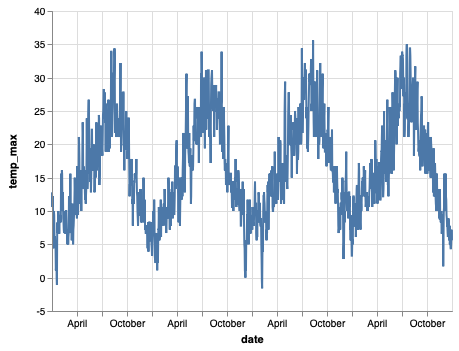

In [79]:
alt.Chart(weather).mark_line().encode(
    y = 'temp_max:Q',
    x = 'date:T'
)

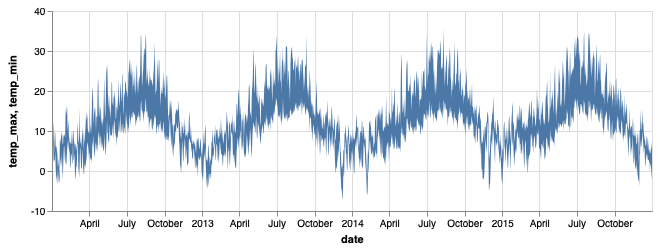

In [80]:
minMaksTemp = alt.Chart(weather).mark_area().encode(
    y = 'temp_max:Q',
    y2 = 'temp_min:Q',
    x = 'date:T',
    tooltip=['temp_min','temp_max', 'weather'],
).properties(
    height=200, 
    width=600
)

minMaksTemp

In [81]:
glidendeGjennomsnittTemp = alt.Chart(weather).mark_line(color='red').encode(
    y = 'temp_mean:Q',
    x = 'date:T',
).properties(
    height=200,
    width=600,
)

Vi setter sammen plottene med +

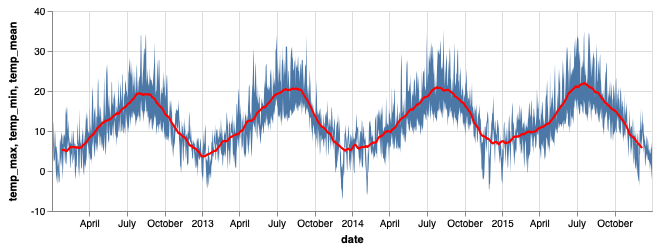

In [82]:
minMaksTemp + glidendeGjennomsnittTemp

Vi ser at temperatursvingningene virker naturlige. Kaldestrundt desember/januar og varmest rundt july/august.

La oss utforske de andre kolonnene også. Her starter vi med å samle winddatene per måned gjennom de 3 årene ('month(date):T').

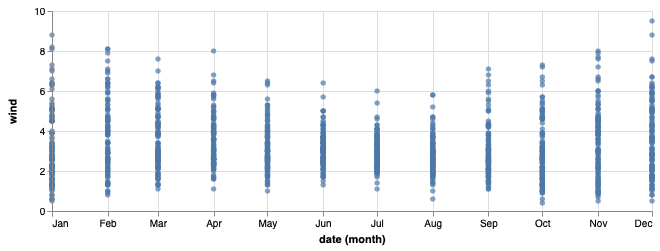

In [83]:
alt.Chart(weather).mark_circle().encode(
    y = 'wind:Q',
    x = 'month(date):T',
).properties(
    height=200, 
    width=600
)

Vi ser tydelig en større variasjon i vindhastigheten om vinteren enn om sommeren. 

La oss fortsette med å også se hvordan værtypene er i de ulike månedene (color ='weather').

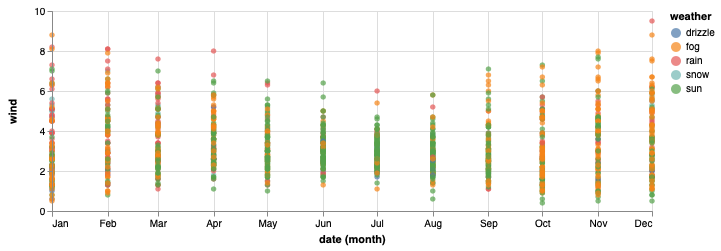

In [84]:
alt.Chart(weather).mark_circle().encode(
    y = 'wind:Q',
    x = 'month(date):T',
    color ='weather',
).properties(
    height=200, 
    width=600
)

Vi ser at det er mer regn og tåke om vinteren, mens det er mye sol om sommeren.

for å se regnmengden i sammenheng med det vi har sett på nå kan vi endre størelse på sirklene etter hvor mye regn det er målt.

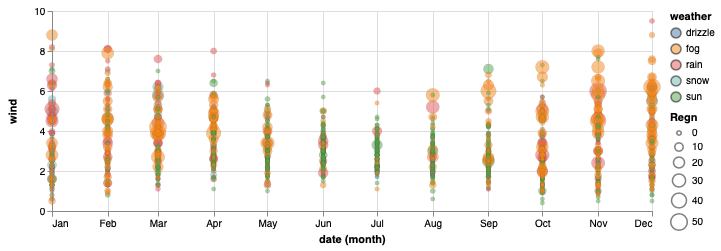

In [85]:
plot = alt.Chart(weather).mark_circle(
    opacity=0.5,
    stroke='black',
    strokeWidth=0.1
    
).encode(
     alt.Size('precipitation:Q',
        scale=alt.Scale(range=[20, 300]),
        legend=alt.Legend(title='Regn'),
    ),
    y = 'wind:Q',
    x = 'month(date):T',
    color ='weather',
    tooltip=['year(date)', 'weather', 'temp_min','temp_max', 'precipitation', 'wind'],



).properties(
    height=200, 
    width=600
)
plot

Det kan se ut som july er den måneden med minst regn og november er den med mest regn. 

Vi kan se på summen av regn for hver måned for å få et tydeligere bilde. Her bytter vi på aksene og setter ulike farger på årene (color ='year(date)')

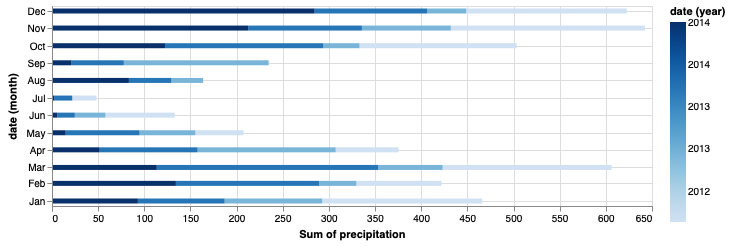

In [86]:
alt.Chart(weather).mark_bar().encode(
    x = 'sum(precipitation):Q',
    y = 'month(date):T',
    color ='year(date)',

).properties(
    height=200, 
    width=600
)

## Filmer

Dette datasettet består av 3200 filmer og innholder bla. informasjon om utgivelsesdato, budsjett, IMDB-stjerner og Rotten Tomatoes prosent. 

In [25]:
movies = data.movies()
movies.size

51216

In [26]:
movies.tail()

,Creative_Type,Director,Distributor,IMDB_Rating,IMDB_Votes,MPAA_Rating,Major_Genre,Production_Budget,Release_Date,Rotten_Tomatoes_Rating,Running_Time_min,Source,Title,US_DVD_Sales,US_Gross,Worldwide_Gross
3196,Contemporary Fiction,Kevin Smith,Weinstein Co.,7.0,55687.0,R,Comedy,24000000.0,31-Oct-08,65.0,101.0,Original Screenplay,Zack and Miri Make a Porno,21240321.0,31452765.0,36851125.0
3197,Dramatization,David Fincher,Paramount Pictures,NaN,NaN,R,Thriller/Suspense,85000000.0,2-Mar-07,89.0,157.0,Based on Book/Short Story,Zodiac,20983030.0,33080084.0,83080084.0
3198,Super Hero,Peter Hewitt,Sony Pictures,3.4,7424.0,PG,Adventure,35000000.0,11-Aug-06,3.0,NaN,Based on Comic/Graphic Novel,Zoom,6679409.0,11989328.0,12506188.0
3199,Historical Fiction,Martin Campbell,Sony Pictures,5.7,21161.0,PG,Adventure,80000000.0,28-Oct-05,26.0,129.0,Remake,The Legend of Zorro,NaN,45575336.0,141475336.0
3200,Historical Fiction,Martin Campbell,Sony Pictures,6.7,4789.0,PG-13,Adventure,65000000.0,17-Jul-98,82.0,136.0,Remake,The Mask of Zorro,NaN,93828745.0,233700000.0


Her kan vi se om det finnes noen sammenhenger mellom dataene i settet. For å gjøre det velger man ofte scatterplot og ser om det er kort avstand fra den rette linja hjennom punktene (lineær regresjon) og til punktene. 

For å ilustrere det kan vi plotte en av kolonnene mot seg selv

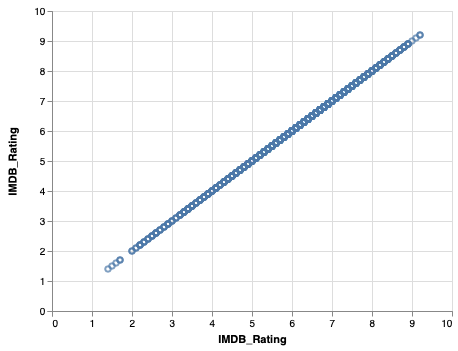

In [27]:
alt.Chart(movies).mark_point().encode(
    x = 'IMDB_Rating',
    y = 'IMDB_Rating'
)

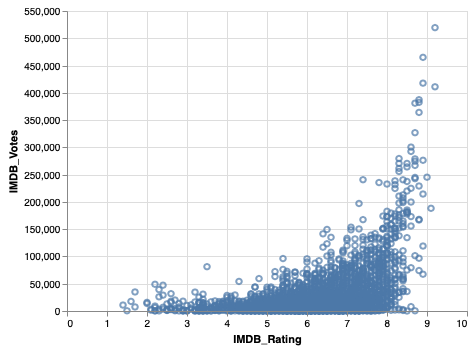

In [28]:
alt.Chart(movies).mark_point().encode(
    x = 'IMDB_Rating',
    y = 'IMDB_Votes'
)

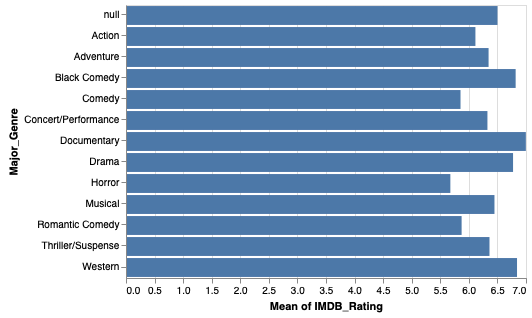

In [29]:
alt.Chart(movies).mark_bar().encode(
    x = 'mean(IMDB_Rating)',
    y = 'Major_Genre',
)

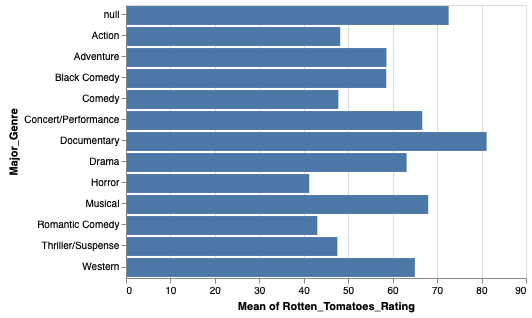

In [33]:
alt.Chart(movies).mark_bar().encode(
    x = 'mean(Rotten_Tomatoes_Rating)',
    y = 'Major_Genre',
)

For å få bedre oversikt kan vi plotte alle variablene mot hverandre

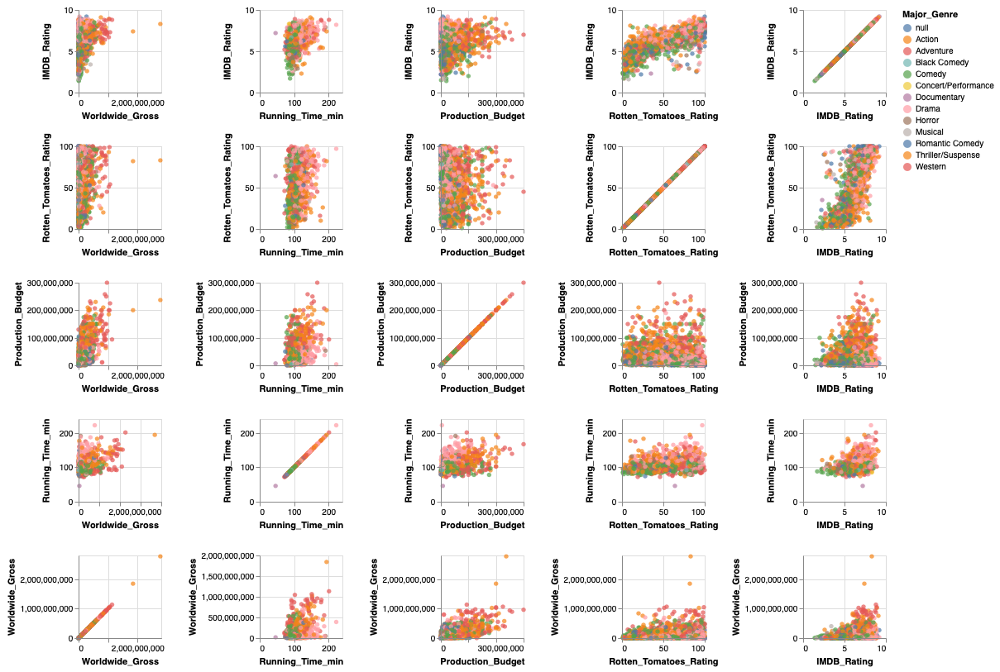

In [87]:
alt.Chart(movies).mark_circle().encode(
    alt.X(alt.repeat("column"), type='quantitative'),
    alt.Y(alt.repeat("row"), type='quantitative'),
    color='Major_Genre:N'
).properties(
    width=100,
    height=100
).repeat(
    row=['IMDB_Rating', 'Rotten_Tomatoes_Rating', 'Production_Budget', 'Running_Time_min', 'Worldwide_Gross'],
    column=['Worldwide_Gross', 'Running_Time_min',  'Production_Budget','Rotten_Tomatoes_Rating', 'IMDB_Rating'],
)